# **Image Classification for Mushroom Species**

## **Loading the Datasets**

### **Import TensorFlow and other libraries**

In [1]:
# Imports needed
import numpy as np
import PIL

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

### **Load in the dataset**

In [2]:
import pathlib
dataset_directory = pathlib.Path("MushroomDatasets")

image_count = len(list(dataset_directory.glob('*/*.jpg')))
print(image_count)

3400


### **Some Examples of Images in the Dataset**

Agaricus bisporus (J.E.Lange) Imbach:

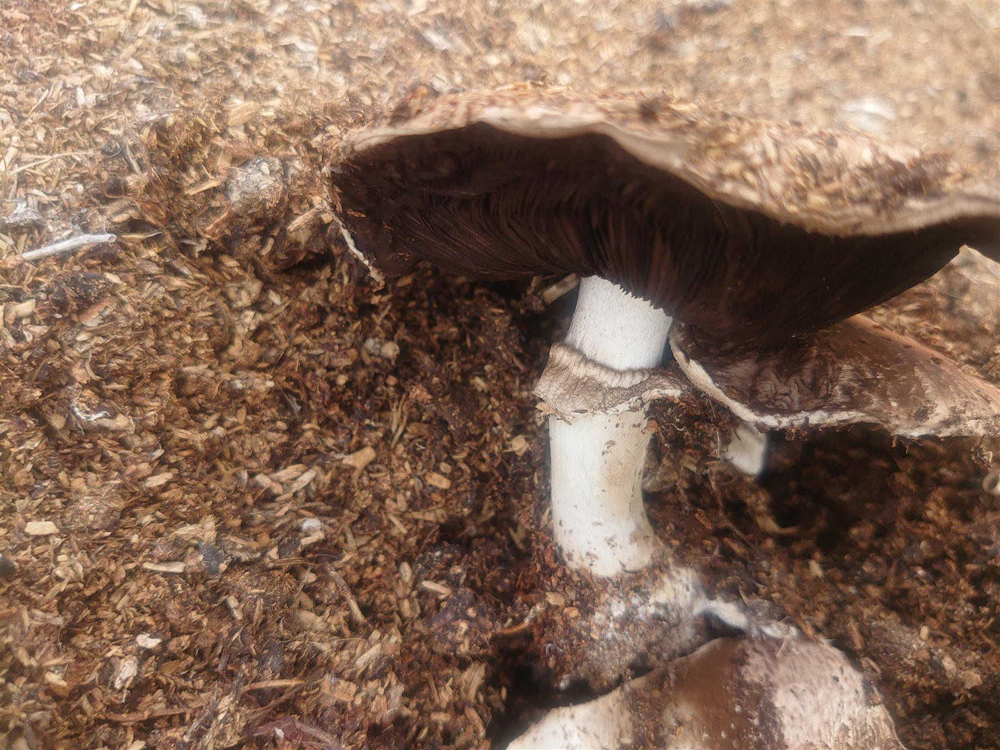

In [3]:
agaricus_bisporus = list(dataset_directory.glob('Agaricus bisporus (J.E.Lange) Imbach/*'))
PIL.Image.open(str(agaricus_bisporus[0]))

Hericium erinaceus (Bull.) Pers:

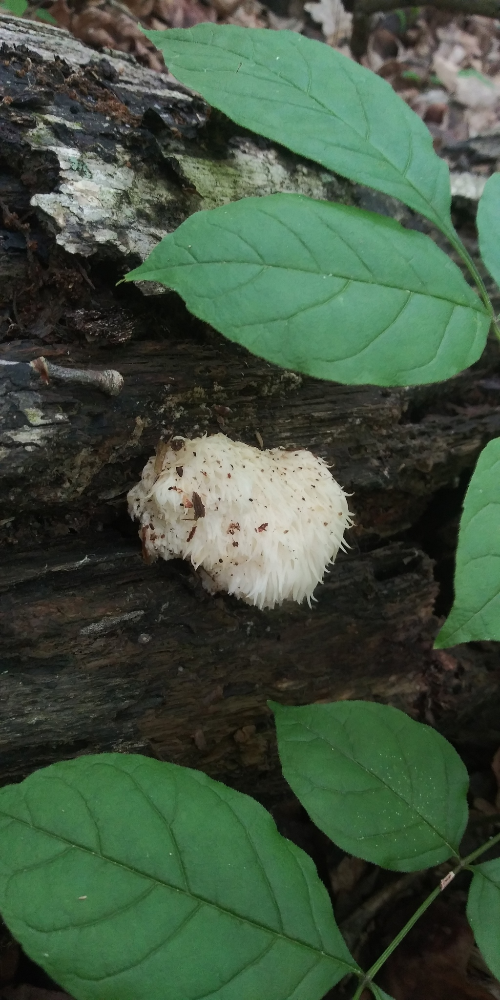

In [4]:
hericium_erinaceus = list(dataset_directory.glob('Hericium erinaceus (Bull.) Pers/*'))
PIL.Image.open(str(hericium_erinaceus[0]))

Suillus luteus (L.) Roussel:

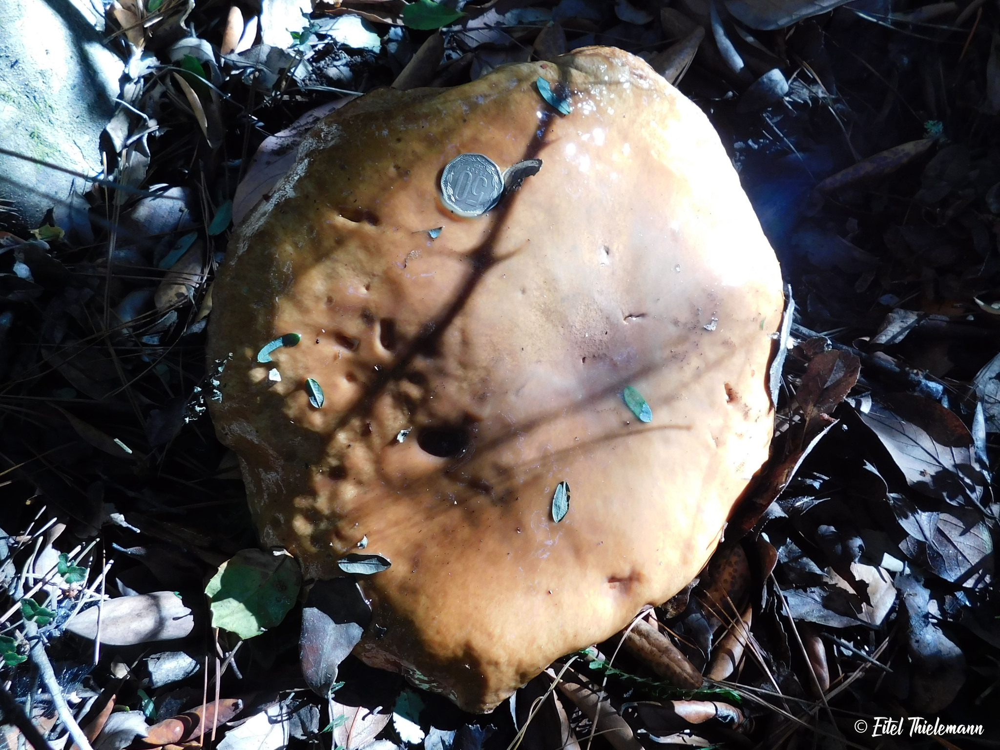

In [5]:
suillus_luteus = list(dataset_directory.glob('Suillus luteus (L.) Roussel/*'))
PIL.Image.open(str(suillus_luteus[0]))

## **Load Data Using a Keras Utility**

### **Creating the Dataset**

In [6]:
batch_size = 16
img_height = 224
img_width = 224

In [7]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_directory,
    labels="inferred",
    label_mode="int",
    validation_split=0.2,
    subset="training",
    seed=123,
    shuffle="True",
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 3400 files belonging to 17 classes.
Using 2720 files for training.


In [8]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_directory,
    labels="inferred",
    label_mode="int",
    validation_split=0.2,
    subset="validation",
    seed=123,
    shuffle="True",
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 3400 files belonging to 17 classes.
Using 680 files for validation.


In [9]:
class_names = train_ds.class_names
print(class_names)

['Agaricus bisporus (J.E.Lange) Imbach', 'Amanita caesarea (Scop.) Pers', 'Auricularia auricula-judae', 'Boletus badius (Fr.) Fr', 'Cantharellus cibarius Fr', 'Flammulina velutipes (Curtis) Singer', 'Gomphus clavatus (Pers.) Gray', 'Gymnopus (Pers.) Roussel', 'Hericium erinaceus (Bull.) Pers', 'Laetiporus sulphureus (Bull.) Murrill', 'Macrolepiota procera (Scop.) Singer', 'Morchella esculenta (L.) Pers', 'Phallus indusiatus Vent', 'Pleurotus ostreatus (Jacq.) P.Kumm', 'Russula cyanoxantha (Schaeff.) Fr', 'Sparassis Fr', 'Suillus luteus (L.) Roussel']


### **Visualize the Data**

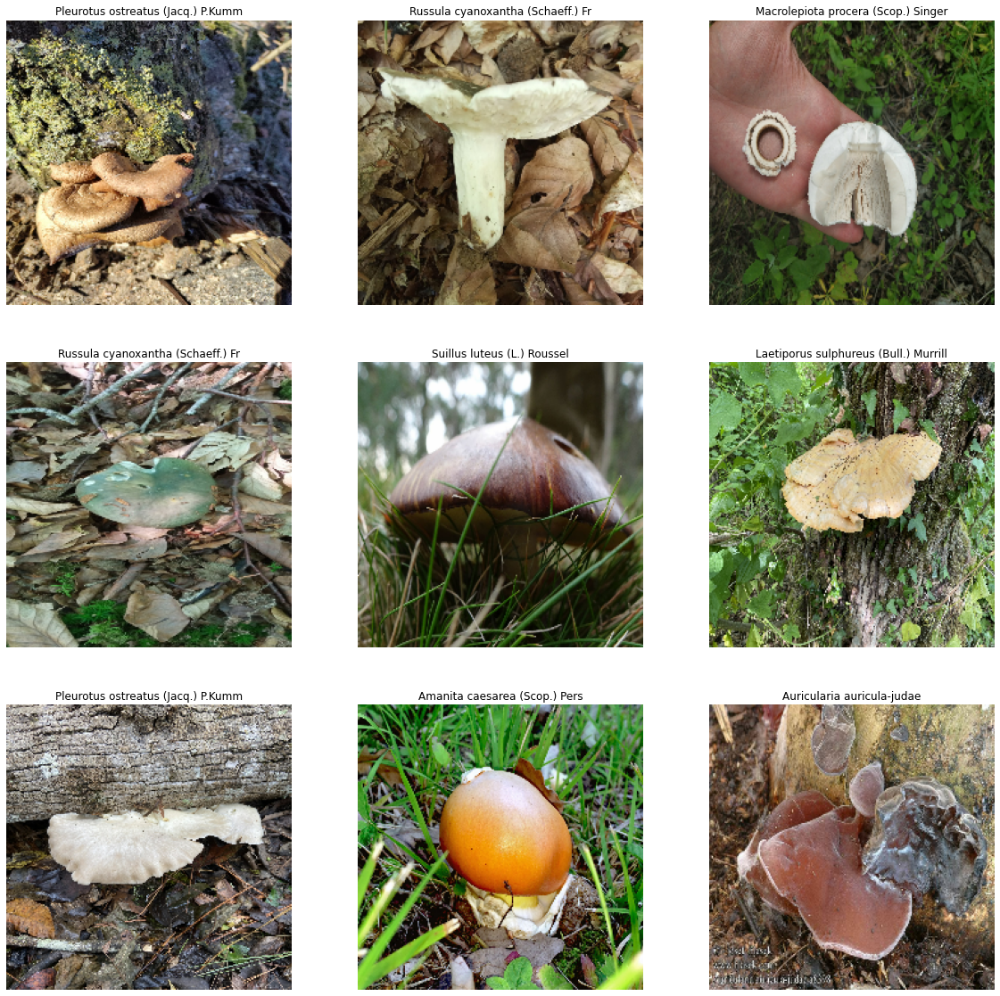

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [11]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(16, 224, 224, 3)
(16,)


### **Configuring the Dataset for Performance**

In [12]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### **Standardize the Data**

In [13]:
normalization_layer = layers.Rescaling(1./255)

In [14]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


### **Augment the Data**

In [15]:
data_augmentation = keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical",
                        input_shape=(img_height,
                                    img_width,
                                    3)),
        layers.RandomRotation(0.2),
        layers.RandomZoom(0.2),
    ])

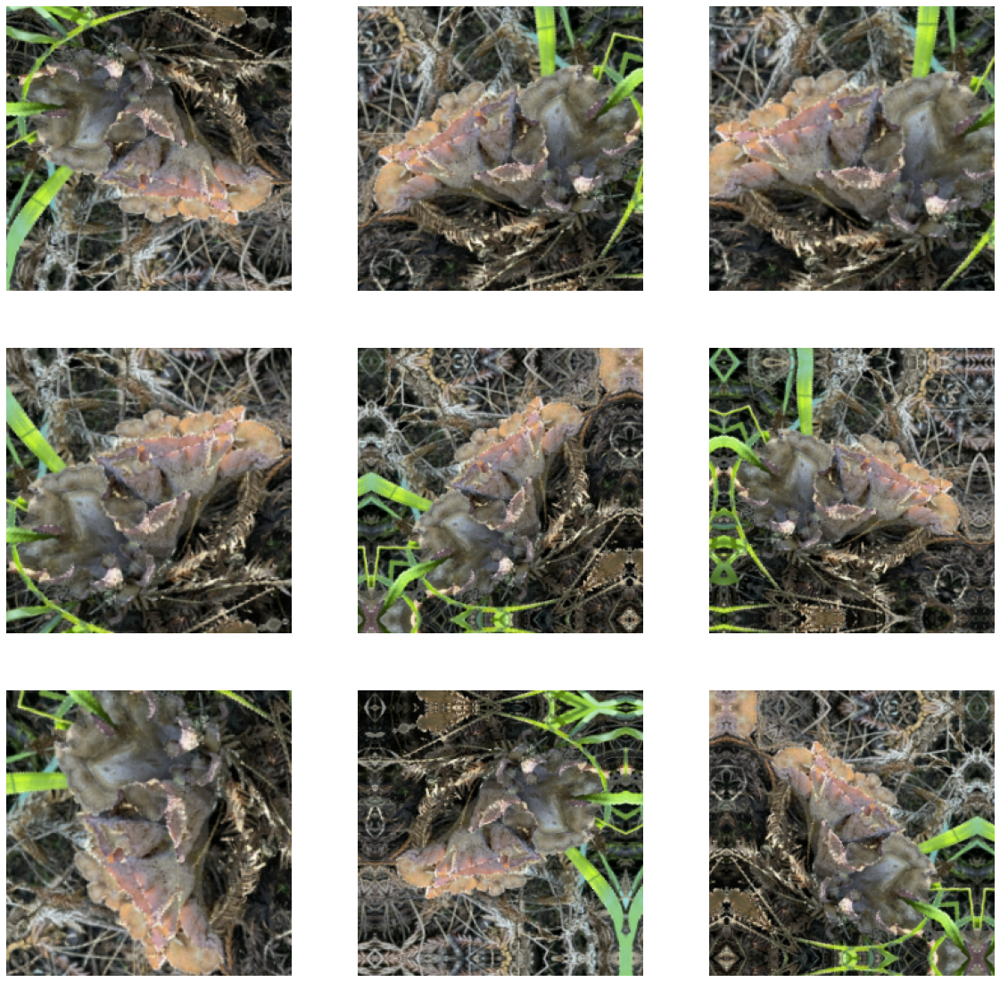

In [16]:
plt.figure(figsize=(20, 20))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

## **Training the Model**

### **Retrieve the Model**

In [17]:
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

num_classes = len(class_names)

resnet_model = ResNet50(weights="imagenet")

last_layer = resnet_model.get_layer("avg_pool")
resnet_layers = Model(inputs=resnet_model.inputs, outputs=last_layer.output)

model = Sequential()
model.add(data_augmentation)
model.add(resnet_layers)
model.add(Dense(num_classes))

model.layers[0].trainable=False

102967424/102967424 [==============================] - 15s 0us/step


### **Compile the Model**

In [18]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

### **Model Summary**

In [19]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 model (Functional)          (None, 2048)              23587712  
                                                                 
 dense (Dense)               (None, 17)                34833     
                                                                 
Total params: 23,622,545
Trainable params: 23,569,425
Non-trainable params: 53,120
_________________________________________________________________


### **Define the Callback**

In [22]:
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

checkpoint = ModelCheckpoint("Model(ResNet50).h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq="epoch")
early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=40, verbose=1, mode='auto')
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1,
                              mode='max', cooldown=2, patience=2, min_lr=0)

### **Train the Model**

In [23]:
epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[checkpoint, early, reduce_lr],
)

Epoch 1/10
170/170 [==============================] - ETA: 0s - loss: 1.2412 - accuracy: 0.6239
Epoch 1: val_accuracy improved from -inf to 0.63971, saving model to Model(ResNet50).h5
170/170 [==============================] - 987s 6s/step - loss: 1.2412 - accuracy: 0.6239 - val_loss: 1.4394 - val_accuracy: 0.6397 - lr: 1.0000e-04
Epoch 2/10
170/170 [==============================] - ETA: 0s - loss: 0.5367 - accuracy: 0.8265
Epoch 2: val_accuracy improved from 0.63971 to 0.70147, saving model to Model(ResNet50).h5
170/170 [==============================] - 988s 6s/step - loss: 0.5367 - accuracy: 0.8265 - val_loss: 1.1127 - val_accuracy: 0.7015 - lr: 1.0000e-04
Epoch 3/10
170/170 [==============================] - ETA: 0s - loss: 0.3450 - accuracy: 0.8923
Epoch 3: val_accuracy improved from 0.70147 to 0.78235, saving model to Model(ResNet50).h5
170/170 [==============================] - 1012s 6s/step - loss: 0.3450 - accuracy: 0.8923 - val_loss: 0.7803 - val_accuracy: 0.7824 - lr: 1.000

### **Visualize Training Results**

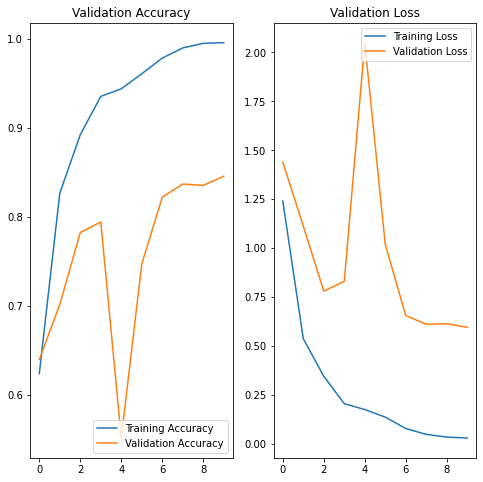

In [24]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training Accuracy')
plt.title('Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training Loss')
plt.title('Validation Loss')
plt.show()

## **Predict on New Data**

In [58]:
testing_directory = pathlib.Path("TestingDatasets")

testing_files = list(testing_directory.glob('*.jpg'))

for file in testing_files:
    image = tf.keras.preprocessing.image.load_img(file, target_size=(img_height, img_width))

    image_array = tf.keras.utils.img_to_array(image)
    image_array = tf.expand_dims(image_array, 0) # Create a batch

    predictions = model.predict(image_array)
    score = tf.nn.softmax(predictions[0])

    print(
        "This {} most likely belongs to {} with a {:.2f} percent confidence."
        .format(file, class_names[np.argmax(score)], 100 * np.max(score))
    )

1/1 [==============================] - 0s 130ms/step
This TestingDatasets\Amanita Caesarea.jpg most likely belongs to Amanita caesarea (Scop.) Pers with a 100.00 percent confidence.
1/1 [==============================] - 0s 134ms/step
This TestingDatasets\Hericium Erinaceus.jpg most likely belongs to Hericium erinaceus (Bull.) Pers with a 99.87 percent confidence.
1/1 [==============================] - 0s 123ms/step
This TestingDatasets\Suillus Luteus.jpg most likely belongs to Suillus luteus (L.) Roussel with a 98.63 percent confidence.
